<a href="https://colab.research.google.com/github/serfrol/skillfactory_rds/blob/master/module_9/Amazon_Toy_Price_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

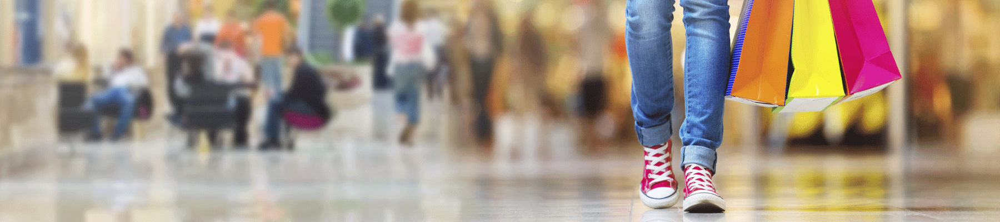

# Amazon Toy Price Prediction

Purpose of this project is to create a model that predicts toy's price based on it's description, customers' review, category, weight and other features.  
The business puprose of this project could be buying toys that have lower price than it should be and then selling those toys for a higher price.

In [1]:
#@title
!pip install -q efficientnet

In [2]:
!pip install catboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import zipfile
import csv
import sys
import os
import os, re, math, random, time, gc, string, pickle, shutil, pathlib, itertools

from catboost import CatBoostRegressor
from sklearn.metrics import mean_squared_error
from sklearn.feature_selection import f_classif, mutual_info_classif
import statsmodels.api as sm

import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import LearningRateScheduler, ModelCheckpoint, EarlyStopping
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.regularizers import l2
from tensorflow.keras import optimizers
from tensorflow.keras.models import Model
from tensorflow.keras.applications.xception import Xception
from tensorflow.keras.applications.efficientnet import EfficientNetB2
from tensorflow.keras.layers import *
from tensorflow import keras
import efficientnet.tfkeras as efn

import tensorflow.keras.models as M
import tensorflow.keras.layers as L
import tensorflow.keras.backend as K

from sklearn.model_selection import train_test_split, StratifiedKFold

import PIL
from PIL import ImageOps, ImageFilter
#увеличим дефолтный размер графиков
from pylab import rcParams
rcParams['figure.figsize'] = 10, 5
#графики в svg выглядят более четкими
%config InlineBackend.figure_format = 'svg' 
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")


print('Python       :', sys.version.split('\n')[0])
print('Numpy        :', np.__version__)
print('Tensorflow   :', tf.__version__)
print('Keras        :', tf.keras.__version__)

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


Python       : 3.7.13 (default, Apr 24 2022, 01:04:09) 
Numpy        : 1.21.6
Tensorflow   : 2.8.2
Keras        : 2.8.0


In [4]:
SEED = 42

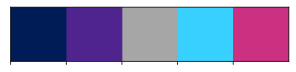

In [5]:
colors = ['#001c57', '#50248f', '#a6a6a6', '#38d1ff','#cc3181']
sns.palplot(sns.color_palette(colors))

## Functions

In [6]:
def modify_cat_col(data, col, n_of_cats):
  ''' modifies column's categories by leaving only top categories (choosen by n_of_cats) '''
  
  top_category = set(data[col].value_counts()[:n_of_cats].to_dict().keys())
  other_category = set(data[col].value_counts().to_dict().keys()) - top_category
  data[col] = data[col].replace(to_replace=other_category, value='other')
  
  return data

In [7]:
def rmse(y_pred, y_true):
  return math.sqrt(mean_squared_error(y_pred, y_true))

In [8]:
def barh_plot(f_imp):
  ''' barh plot for catboost feature_importances visualisation '''
  f_imp.set_index('Feature Id').plot(kind='barh')

In [9]:
def num_vis(col, title=None):
    '''Visualisation of numerical features'''

    title = title if title is not None else f"Distribution for '{col}"
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5),)
    fig = sm.qqplot(col, fit=True, line='45', ax=ax1)
    fig.suptitle(title, fontsize=20)

    sns.distplot(col.values, bins=20, color=colors[1], ax=ax2)
    sns.violinplot(col.values, color=colors[3], bw=.3, cut=1, linewidth=4)

    ax1.set_title('QQ-plot')
    ax2.set_title('Distribution')
    ax3.set_title('Violinplot')

    plt.show()

In [10]:
def find_outliers(data):
    '''Find outliers'''
    q1, q3 = np.percentile(sorted(data), [25, 75])

    IQR = q3 - q1

    bot = q1 - (1.5 * IQR)
    top = q3 + (1.5 * IQR)
    count = len(data[data < bot]) + len(data[data > top])

    print(f'Bot: {round(bot,3)}, Top: {round(top,3)}, Outliers: {count}')

In [11]:
def corr_matrix(data, det=True, pltx=10, plty=10):
    '''Funcion is called for making correlation matrix'''
    
    X = data.corr()
    if det:
        
        evals,evec = np.linalg.eig(X)
        ev_product = np.prod(evals)
    
        print(f'Rank of Matrix: {np.linalg.matrix_rank(X)}')
        print(f'Determinant of matrix: {np.round(ev_product,4)}')
        print(f'Shape of matrix: {np.shape(X)}')
    
    plt.figure(figsize=(pltx,plty))
    sns.heatmap(X,vmin=0,vmax=.9,annot=True,square=True)
    plt.show()

## Upload

In [12]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).
/gdrive


In [13]:
data = pd.read_csv("/gdrive/MyDrive/amazon_co-ecommerce_sample.csv")

In [14]:
data.head()

,uniq_id,product_name,manufacturer,price,number_available_in_stock,number_of_reviews,number_of_answered_questions,average_review_rating,amazon_category_and_sub_category,customers_who_bought_this_item_also_bought,description,product_information,product_description,items_customers_buy_after_viewing_this_item,customer_questions_and_answers,customer_reviews,sellers
0,eac7efa5dbd3d667f26eb3d3ab504464,Hornby 2014 Catalogue,Hornby,£3.42,5 new,15,1.0,4.9 out of 5 stars,Hobbies > Model Trains & Railway Sets > Rail V...,http://www.amazon.co.uk/Hornby-R8150-Catalogue...,Product Description Hornby 2014 Catalogue Box ...,Technical Details Item Weight640 g Product Dim...,Product Description Hornby 2014 Catalogue Box ...,http://www.amazon.co.uk/Hornby-R8150-Catalogue...,Does this catalogue detail all the previous Ho...,Worth Buying For The Pictures Alone (As Ever) ...,"{""seller""=>[{""Seller_name_1""=>""Amazon.co.uk"", ..."
1,b17540ef7e86e461d37f3ae58b7b72ac,FunkyBuys® Large Christmas Holiday Express Fes...,FunkyBuys,£16.99,NaN,2,1.0,4.5 out of 5 stars,Hobbies > Model Trains & Railway Sets > Rail V...,http://www.amazon.co.uk/Christmas-Holiday-Expr...,Size Name:Large FunkyBuys® Large Christmas Hol...,Technical Details Manufacturer recommended age...,Size Name:Large FunkyBuys® Large Christmas Hol...,http://www.amazon.co.uk/Christmas-Holiday-Expr...,can you turn off sounds // hi no you cant turn...,Four Stars // 4.0 // 18 Dec. 2015 // By\n \...,"{""seller""=>{""Seller_name_1""=>""UHD WHOLESALE"", ..."
2,348f344247b0c1a935b1223072ef9d8a,CLASSIC TOY TRAIN SET TRACK CARRIAGES LIGHT EN...,ccf,£9.99,2 new,17,2.0,3.9 out of 5 stars,Hobbies > Model Trains & Railway Sets > Rail V...,http://www.amazon.co.uk/Classic-Train-Lights-B...,BIG CLASSIC TOY TRAIN SET TRACK CARRIAGE LIGHT...,Technical Details Manufacturer recommended age...,BIG CLASSIC TOY TRAIN SET TRACK CARRIAGE LIGHT...,http://www.amazon.co.uk/Train-With-Tracks-Batt...,What is the gauge of the track // Hi Paul.Trut...,**Highly Recommended!** // 5.0 // 26 May 2015 ...,"{""seller""=>[{""Seller_name_1""=>""DEAL-BOX"", ""Sel..."
3,e12b92dbb8eaee78b22965d2a9bbbd9f,HORNBY Coach R4410A BR Hawksworth Corridor 3rd,Hornby,£39.99,NaN,1,2.0,5.0 out of 5 stars,Hobbies > Model Trains & Railway Sets > Rail V...,NaN,Hornby 00 Gauge BR Hawksworth 3rd Class W 2107...,Technical Details Item Weight259 g Product Dim...,Hornby 00 Gauge BR Hawksworth 3rd Class W 2107...,NaN,NaN,I love it // 5.0 // 22 July 2013 // By\n \n...,NaN
4,e33a9adeed5f36840ccc227db4682a36,Hornby 00 Gauge 0-4-0 Gildenlow Salt Co. Steam...,Hornby,£32.19,NaN,3,2.0,4.7 out of 5 stars,Hobbies > Model Trains & Railway Sets > Rail V...,http://www.amazon.co.uk/Hornby-R6367-RailRoad-...,Product Description Hornby RailRoad 0-4-0 Gild...,Technical Details Item Weight159 g Product Dim...,Product Description Hornby RailRoad 0-4-0 Gild...,http://www.amazon.co.uk/Hornby-R2672-RailRoad-...,NaN,Birthday present // 5.0 // 14 April 2014 // By...,NaN


Leave only data where price is present

In [15]:
data = data[data.price.notna()]

In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8565 entries, 0 to 9999
Data columns (total 17 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   uniq_id                                      8565 non-null   object 
 1   product_name                                 8565 non-null   object 
 2   manufacturer                                 8560 non-null   object 
 3   price                                        8565 non-null   object 
 4   number_available_in_stock                    6336 non-null   object 
 5   number_of_reviews                            8550 non-null   object 
 6   number_of_answered_questions                 7891 non-null   float64
 7   average_review_rating                        8550 non-null   object 
 8   amazon_category_and_sub_category             8013 non-null   object 
 9   customers_who_bought_this_item_also_bought   7628 non-null   object 
 10  

In [17]:
df = data.copy()

## Preprocessing

### **price** - Target feature

Some prices are presented with price ranges, which may be pretty wide. Decided to leave only fixed prices and remove price ranges instead of taking average (19 total)

In [18]:
def mapprice(v):
    if pd.isnull(v):
        return 0
    try:
        return float(v[1:])
    except ValueError:
        return 0
    
df['price'] = df['price'].map(mapprice)

In [19]:
df = df[df.price > 0].copy()

### **manufacturer**

In [20]:
df.manufacturer.value_counts()

Oxford Diecast        152
LEGO                  138
Disney                136
Playmobil             120
The Puppet Company    102
                     ... 
Noris                   1
Mammut                  1
Stephens                1
Xcut                    1
Green Hornet            1
Name: manufacturer, Length: 2362, dtype: int64

In [21]:
df = df[df.manufacturer.isna() == False].copy()

In [22]:
df = modify_cat_col(df, 'manufacturer', 30)

### **number_available_in_stock, new**

We could take number available in stock and if the toy is used/refubrished/new/collectible

In [23]:
df.number_available_in_stock.value_counts(dropna=False)

NaN        2210
2 new      1099
3 new       847
4 new       671
5 new       522
           ... 
71 new        1
52 new        1
72 new        1
55 new        1
10 used       1
Name: number_available_in_stock, Length: 83, dtype: int64

In [24]:
df.number_available_in_stock = df.number_available_in_stock.str.split().fillna(-1)

In [25]:
df['new'] = df.number_available_in_stock.apply(lambda x: x[1] if x != -1 else x)
df.new = df.new.replace(0, 'unknown')

In [26]:
df.number_available_in_stock = df.number_available_in_stock.apply(lambda x: int(x[0]) if x != -1 else int(x))

### **number_of_reviews**

15 missing values, replace with 0

In [27]:
df.number_of_reviews.value_counts(dropna=False).to_dict()

{'1': 3700,
 '1,040': 1,
 '1,399': 1,
 '10': 92,
 '100': 2,
 '101': 5,
 '102': 3,
 '103': 3,
 '104': 1,
 '105': 2,
 '107': 2,
 '108': 1,
 '109': 1,
 '11': 91,
 '110': 3,
 '111': 2,
 '113': 1,
 '114': 1,
 '115': 2,
 '116': 2,
 '117': 2,
 '118': 3,
 '119': 1,
 '12': 89,
 '120': 2,
 '122': 2,
 '123': 2,
 '124': 1,
 '125': 2,
 '126': 1,
 '127': 2,
 '128': 1,
 '129': 3,
 '13': 65,
 '130': 1,
 '131': 1,
 '132': 1,
 '133': 1,
 '134': 1,
 '136': 1,
 '137': 1,
 '138': 1,
 '139': 1,
 '14': 61,
 '140': 2,
 '141': 1,
 '142': 1,
 '144': 1,
 '145': 1,
 '146': 1,
 '147': 1,
 '15': 56,
 '151': 1,
 '155': 1,
 '156': 1,
 '158': 1,
 '16': 64,
 '160': 1,
 '164': 1,
 '165': 1,
 '17': 55,
 '172': 1,
 '177': 1,
 '18': 34,
 '181': 1,
 '183': 2,
 '185': 2,
 '19': 48,
 '193': 1,
 '199': 2,
 '2': 1204,
 '20': 41,
 '200': 1,
 '204': 1,
 '21': 32,
 '210': 1,
 '22': 36,
 '220': 2,
 '23': 31,
 '230': 1,
 '238': 1,
 '24': 30,
 '241': 1,
 '243': 1,
 '249': 1,
 '25': 31,
 '253': 1,
 '26': 24,
 '262': 1,
 '263': 1,
 '26

In [28]:
df.number_of_reviews = df.number_of_reviews.str.replace(',', '')

In [29]:
df.number_of_reviews = df.number_of_reviews.fillna(0)
df.number_of_reviews = df.number_of_reviews.astype('int64')

### **number_of_answered_questions**

In [30]:
df.number_of_answered_questions.value_counts(dropna=False)

1.0     5459
2.0     1248
NaN      673
3.0      502
4.0      207
5.0      139
6.0       65
11.0      65
9.0       51
7.0       35
13.0      20
12.0      19
23.0      13
39.0      12
10.0      11
19.0      11
8.0        5
28.0       4
14.0       1
17.0       1
Name: number_of_answered_questions, dtype: int64

In [31]:
df.number_of_answered_questions = df.number_of_answered_questions.fillna(0)

In [32]:
df.number_of_answered_questions = df.number_of_answered_questions.astype('int64')

### **average_review_rating**

Fill missing values(15) with average value

In [33]:
df.average_review_rating.value_counts(dropna=False)

5.0 out of 5 stars    4406
4.0 out of 5 stars    1103
4.5 out of 5 stars     607
4.8 out of 5 stars     491
4.7 out of 5 stars     457
4.3 out of 5 stars     346
4.6 out of 5 stars     341
4.4 out of 5 stars     247
4.9 out of 5 stars     207
4.2 out of 5 stars     178
4.1 out of 5 stars     127
NaN                     15
3.9 out of 5 stars       6
3.0 out of 5 stars       3
3.5 out of 5 stars       2
3.3 out of 5 stars       2
3.6 out of 5 stars       2
2.3 out of 5 stars       1
Name: average_review_rating, dtype: int64

In [34]:
def get_rating(r):
  if pd.isnull(r):
    return np.nan
  try:
    return float(r[:3])
  except ValueError:
    return 0

df.average_review_rating = df.average_review_rating.apply(get_rating)

In [35]:
df.average_review_rating = df.average_review_rating.fillna(round(df.average_review_rating.mean(),1))

### **amazon_category_and_sub_category**

Might be useful to split into multiple columns - category & sub_category. Missing values filled with most common value - 'Hobbies' & 'Model Trains & Railway Sets'

In [36]:
df.amazon_category_and_sub_category = df.amazon_category_and_sub_category.str.split(" > ").to_list()

In [37]:
df.amazon_category_and_sub_category.fillna(0, inplace=True)

In [38]:
df['category'] = df.amazon_category_and_sub_category.apply(lambda x: x[0] if x != 0 else x)
df['sub_category'] = df.amazon_category_and_sub_category.apply(lambda x: x[1] if x != 0 else x)

In [39]:
df.category.replace(0, 'Hobbies', inplace=True)
df.sub_category.replace(0, 'Model Trains & Railway Sets', inplace=True)

In [40]:
df = modify_cat_col(df, 'category', 14)

In [41]:
df = modify_cat_col(df, 'sub_category', 30)

### **product_information**

There's some useful information in this column, which could be taken out - Item Weight, Best Sellers Rank

In [42]:
df.product_information[0]

'Technical Details Item Weight640 g Product Dimensions29.6 x 20.8 x 1 cm Manufacturer recommended age:6 years and up Item model numberR8148 Main Language(s)English manual, English Number of Game Players1 Number of Puzzle Pieces1 Assembly RequiredNo Scale1:72 Engine Typeelectric Track Width/GaugeHO Batteries Required?No Batteries Included?No Material Type(s)Paper Material Care InstructionsNo Remote Control Included?No Radio Control Suitabilityindoor Colorwhite \xa0\xa0 Additional Information ASINB00HJ208KO Best Sellers Rank 52,854 in Toys & Games (See top 100) #69 in\xa0Toys & Games > Model Trains & Railway Sets > Rail Vehicles > Trains Shipping Weight640 g Delivery Destinations:Visit the Delivery Destinations Help page to see where this item can be delivered. Date First Available24 Dec. 2013 \xa0\xa0 Feedback \xa0Would you like to update product info or give feedback on images?'

In [43]:
df.product_information.fillna(0, inplace=True)

In [44]:
df.product_information = df.product_information.apply(lambda x: str(x).lower())

In [45]:
len(df[df.product_information.str.contains('weight')].product_information)

7089

### **weight_g**
weight in grams, fill missing values by average weight per sub_category

In [46]:
def get_weight(s):
  ''' returns weight + kg or g '''
  if type(s) == list:
    count = 0
    for i in s:
      count += 1
      if 'weight' in i:
        return i[6:] + s[count]
  else:
    return s

In [47]:
df['weight_g'] = df.product_information.str.split().apply(get_weight)

In [48]:
df.weight_g = df.weight_g.str.replace("kg", '000')
df.weight_g = df.weight_g.str.replace('grams', '')
df.weight_g = df.weight_g.str.replace('g', '')
df.weight_g = df.weight_g.str.replace('.', '')

In [49]:
df.weight_g = df.weight_g.fillna(0).astype('int64')

In [50]:
w_per_subcat = df[['sub_category','weight_g']][df.weight_g > 0].groupby('sub_category').median().to_dict()
w_per_subcat = w_per_subcat['weight_g']

In [51]:
w_per_subcat

{'Accessories': 100.0,
 'Banners, Stickers & Confetti': 50.0,
 'Beach Toys': 794.0,
 'Card Games': 118.0,
 "Children's Craft Kits": 59.0,
 'Collectible Figures & Memorabilia': 254.0,
 'Costumes': 381.0,
 'Decorations': 59.0,
 'Dice & Dice Games': 59.0,
 'Dinosaurs': 190.5,
 'Disney': 222.0,
 "Dolls' House Dolls & Accessories": 9.0,
 'Educational Games': 308.5,
 'Hand Puppets': 159.0,
 'Hasbro': 181.0,
 'Jigsaws': 590.0,
 'Kites & Flight Toys': 206.5,
 'Knights & Castles': 143.0,
 'Model Building Kits': 290.0,
 'Model Trains & Railway Sets': 181.0,
 'Paper & Stickers': 68.0,
 'Pirates': 200.0,
 'Remote Controlled Devices': 91.0,
 'Science Fiction & Fantasy': 204.0,
 'Slot Cars, Race Tracks & Accessories': 222.0,
 'Soft Dolls': 181.0,
 'Star Wars': 100.0,
 'Toy Trains & Accessories': 122.5,
 'Toy Vehicles & Accessories': 227.0,
 'Trading Cards & Accessories': 150.0,
 'other': 281.0}

In [52]:
df.weight_g = df.weight_g.replace(0, np.nan)

In [53]:
df.weight_g.isna().sum()

1452

In [54]:
df.weight_g = df.apply(lambda x: w_per_subcat[x.sub_category] if ((np.isnan(x.weight_g)) and (x.sub_category in w_per_subcat)) else x.weight_g, axis=1)

In [55]:
df.weight_g.isna().sum()

0

In [56]:
df.weight_g = df.weight_g.fillna(df.weight_g.median())

### **total_rank**
toy's rank in Toys & Games

### **sub_rank**
toy's rank in it's sub_category

In [57]:
df.product_information[100].split()

['technical',
 'details',
 'item',
 'weight2.8',
 'kg',
 'product',
 'dimensions45.8',
 'x',
 '30',
 'x',
 '10.8',
 'cm',
 'manufacturer',
 'recommended',
 'age:3',
 'years',
 'and',
 'up',
 'additional',
 'information',
 'asinb00grb5bcs',
 'best',
 'sellers',
 'rank',
 '153,063',
 'in',
 'toys',
 '&',
 'games',
 '(see',
 'top',
 '100)',
 '#226',
 'in',
 'toys',
 '&',
 'games',
 '>',
 'model',
 'trains',
 '&',
 'railway',
 'sets',
 '>',
 'rail',
 'vehicles',
 '>',
 'trains',
 'shipping',
 'weight2.8',
 'kg',
 'delivery',
 'destinations:visit',
 'the',
 'delivery',
 'destinations',
 'help',
 'page',
 'to',
 'see',
 'where',
 'this',
 'item',
 'can',
 'be',
 'delivered.',
 'date',
 'first',
 'available18',
 'nov.',
 '2013',
 'feedback',
 'would',
 'you',
 'like',
 'to',
 'update',
 'product',
 'info',
 'or',
 'give',
 'feedback',
 'on',
 'images?']

In [58]:
def get_rank(r):
  ''' returns rank in overall category and in sub category '''
  if type(r) == list:
    count = 0
    for i in r:
      count += 1
      if 'rank' in i:
        return r[count] + " " + r[count + 8]
  else:
    return r

In [59]:
df['total_rank'] = df.product_information.str.split().apply(get_rank)

In [60]:
df.total_rank = df.total_rank.str.split()

In [61]:
df['total_rank'] = df['total_rank'].fillna(0)

In [62]:
df['sub_rank'] = df.total_rank.apply(lambda x: x[1] if x != 0 else x)
df['total_rank'] = df['total_rank'].apply(lambda x: x[0] if x != 0 else x)

In [63]:
df.total_rank = df.total_rank.str.replace(',', '')

In [64]:
to_replace = []
for i in df.total_rank.dropna():
  try:
    int(i)
  except ValueError:
    if i not in to_replace:  
      to_replace.append(i)

In [65]:
to_replace

['assembly', 'batteries', 'colourmulitcoloured']

In [66]:
pattern = '|'.join(to_replace)

In [67]:
df.total_rank = df.total_rank.replace(pattern, 0, regex=True)
df.total_rank.fillna(0, inplace=True)
df.total_rank = df.total_rank.astype('int64')
df.total_rank.replace(0, int(df.total_rank.median()), inplace=True)

In [68]:
df.sub_rank = df.sub_rank.str.replace('#', '')
df.sub_rank = df.sub_rank.str.replace(',', '')

In [69]:
to_replace = []
for i in df.sub_rank.dropna():
  try:
    int(i)
  except ValueError:
    if i not in to_replace:  
      to_replace.append(i)

to_replace

['shipping',
 'toys',
 'delivery',
 'sellers',
 'grocery',
 'office',
 'weight100',
 'reviews',
 'additional',
 'in']

In [70]:
pattern = '|'.join(to_replace)

In [71]:
df.sub_rank = df.sub_rank.replace(pattern, 0, regex=True)
df.sub_rank.fillna(0, inplace=True)
df.sub_rank = df.sub_rank.astype('int64')
df.sub_rank.replace(0, int(df.sub_rank.median()), inplace=True)

In [72]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8541 entries, 0 to 9999
Data columns (total 23 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   uniq_id                                      8541 non-null   object 
 1   product_name                                 8541 non-null   object 
 2   manufacturer                                 8541 non-null   object 
 3   price                                        8541 non-null   float64
 4   number_available_in_stock                    8541 non-null   int64  
 5   number_of_reviews                            8541 non-null   int64  
 6   number_of_answered_questions                 8541 non-null   int64  
 7   average_review_rating                        8541 non-null   float64
 8   amazon_category_and_sub_category             8541 non-null   object 
 9   customers_who_bought_this_item_also_bought   7604 non-null   object 
 10  

### **sellers**

Information about previous sellers and prices. Might be useful to get previous sellers number and previous prices.

### **sellers_count**  
Count of sellers for toy

In [73]:
df.sellers[1000]

'{"seller"=>[{"Seller_name_1"=>"Toysafari Worldwide", "Seller_price_1"=>"£17.99"}, {"Seller_name_2"=>"a1 Toys", "Seller_price_2"=>"£18.99"}, {"Seller_name_3"=>"Amazon.co.uk", "Seller_price_3"=>"£21.25"}, {"Seller_name_4"=>"F&F Toys", "Seller_price_4"=>"£22.95"}, {"Seller_name_5"=>"Toy Zany", "Seller_price_5"=>"£24.24"}, {"Seller_name_6"=>"GamesQuest", "Seller_price_6"=>"£20.99"}, {"Seller_name_7"=>"Figurine-collector-fr", "Seller_price_7"=>"£20.22"}, {"Seller_name_8"=>"X-Comics GmbH", "Seller_price_8"=>"£20.11"}, {"Seller_name_9"=>"Bluepoint_eCommerce", "Seller_price_9"=>"£21.67"}, {"Seller_name_10"=>"Toy Palace GmbH", "Seller_price_10"=>"£20.21"}]}'

In [74]:
df.sellers = df.sellers.str.replace('=>', ':')
df.sellers.fillna('0', inplace=True)

In [75]:
import ast
df.sellers = df.sellers.apply(lambda x: ast.literal_eval(x))
df.sellers = df.sellers.apply(lambda x: x['seller'] if x != 0 else x)

In [76]:
def get_seller_count(s):
  if type(s) == list:
    return len(s)
  elif type(s) == dict:
    return len(s) / 2
  else:
    return s

In [77]:
df['sellers_count'] = df.sellers.apply(get_seller_count)

In [78]:
df['sellers_count'] = df['sellers_count'].astype('int64')

In [79]:
df['sellers_count'].value_counts()

0     2478
1     1475
10    1376
2      778
3      641
4      495
5      369
6      317
7      252
8      205
9      154
20       1
Name: sellers_count, dtype: int64

### **most_recent_price**
Most recent price of the toy - price before current price  
(30% missing values, might be indicating that toy was not sold before)

In [80]:
def get_price_recent(p1):
  if type(p1) == list:
    return p1[1]['Seller_price_2']
  else:
    return -1

In [81]:
df['most_recent_price'] = df.sellers.apply(get_price_recent)

In [82]:
df.most_recent_price = df.most_recent_price.str.replace('£','')
df.most_recent_price = df.most_recent_price.fillna(-1)
df.most_recent_price = df.most_recent_price.astype('float64')

In [83]:
df[['price', 'most_recent_price']]

,price,most_recent_price
0,3.42,0.19
1,16.99,-1.00
2,9.99,29.90
3,39.99,-1.00
4,32.19,-1.00
...,...,...
9995,22.95,19.99
9996,39.99,-1.00
9997,43.99,116.50
9998,49.81,44.83


### **first_price**
first price of the toy

In [84]:
def get_price_first(p1):
  if type(p1) == list:
    return p1[-1][f'Seller_price_{len(p1)}']
  else:
    return -1

In [85]:
df['first_price'] = df.sellers.apply(get_price_first)

In [86]:
df.first_price = df.first_price.str.replace('£','')
df.first_price = df.first_price.str.replace(',','')
df.first_price = df.first_price.fillna(-1)
df.first_price = df.first_price.astype('float64')

In [87]:
df[['most_recent_price', 'first_price']]

,most_recent_price,first_price
0,0.19,37.62
1,-1.00,-1.00
2,29.90,29.90
3,-1.00,-1.00
4,-1.00,-1.00
...,...,...
9995,19.99,38.04
9996,-1.00,-1.00
9997,116.50,124.95
9998,44.83,32.19


### Clean up

Columns to remove:  
**uniq_id** - no useful information there  
**product_name** - mafufacturer info is in another column, hard to classify raw text in this case  
**product_information** - moved useful information to another column  
**amazon_category_and_sub_category** - split into different columns  
**items_customers_buy_after_viewing_this_item** - no useful information   
**customers_who_bought_this_item_also_bought** - no useful information  
**sellers** - split into different columns  


In [88]:
cols_to_drop = ['uniq_id', 'product_name', 'product_information', 'amazon_category_and_sub_category',
                'customers_who_bought_this_item_also_bought', 'items_customers_buy_after_viewing_this_item', 'sellers']

In [89]:
df.drop(cols_to_drop, axis=1, inplace=True)

In [90]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8541 entries, 0 to 9999
Data columns (total 19 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   manufacturer                    8541 non-null   object 
 1   price                           8541 non-null   float64
 2   number_available_in_stock       8541 non-null   int64  
 3   number_of_reviews               8541 non-null   int64  
 4   number_of_answered_questions    8541 non-null   int64  
 5   average_review_rating           8541 non-null   float64
 6   description                     7995 non-null   object 
 7   product_description             7995 non-null   object 
 8   customer_questions_and_answers  818 non-null    object 
 9   customer_reviews                8524 non-null   object 
 10  new                             8541 non-null   object 
 11  category                        8541 non-null   object 
 12  sub_category                    85

In [91]:
num_cols = df.select_dtypes(include=['float64', 'int64']).columns.to_list()
text_cols = ['description', 'product_description', 'customer_questions_and_answers', 'customer_reviews']
cat_cols = list(set(df.select_dtypes(include=['object']).columns.to_list()) - set(text_cols))

In [92]:
num_cols, text_cols, cat_cols

(['price',
  'number_available_in_stock',
  'number_of_reviews',
  'number_of_answered_questions',
  'average_review_rating',
  'weight_g',
  'total_rank',
  'sub_rank',
  'sellers_count',
  'most_recent_price',
  'first_price'],
 ['description',
  'product_description',
  'customer_questions_and_answers',
  'customer_reviews'],
 ['manufacturer', 'category', 'sub_category', 'new'])

In [93]:
df = df.reset_index()

## Naive Model

In [94]:
df_naive = df[['price', 'total_rank', 'category', 'sub_category', 'manufacturer']].copy()

In [95]:
df_naive = pd.get_dummies(df_naive, columns=['category', 'sub_category', 'manufacturer'], dummy_na=False)

In [96]:
y = df_naive['price']
X = df_naive.drop(['price'], axis=1)

In [97]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=SEED)

In [98]:
catboost_naive_model = CatBoostRegressor(iterations = 5000,
                          #depth=10,
                          #learning_rate = 0.5,
                          random_seed = SEED,
                          eval_metric='RMSE',
                          od_wait=500,
                          train_dir='/content'
                         )
catboost_naive_model.fit(X_train, np.log(y_train),
         eval_set=(X_test, np.log(y_test)),
         verbose_eval=100,
         use_best_model=True,
         #plot=True,
         )

Learning rate set to 0.025796
0:	learn: 1.0979314	test: 1.1314132	best: 1.1314132 (0)	total: 66.8ms	remaining: 5m 34s
100:	learn: 0.8950538	test: 0.9174779	best: 0.9174779 (100)	total: 833ms	remaining: 40.4s
200:	learn: 0.8700780	test: 0.8924652	best: 0.8924652 (200)	total: 1.23s	remaining: 29.5s
300:	learn: 0.8585170	test: 0.8818300	best: 0.8818300 (300)	total: 1.66s	remaining: 25.9s
400:	learn: 0.8490582	test: 0.8753987	best: 0.8753987 (400)	total: 2.13s	remaining: 24.4s
500:	learn: 0.8399207	test: 0.8712157	best: 0.8712157 (500)	total: 2.69s	remaining: 24.1s
600:	learn: 0.8323481	test: 0.8686321	best: 0.8686321 (600)	total: 3.26s	remaining: 23.9s
700:	learn: 0.8260877	test: 0.8678023	best: 0.8678023 (700)	total: 3.73s	remaining: 22.9s
800:	learn: 0.8206833	test: 0.8668325	best: 0.8668310 (799)	total: 4.21s	remaining: 22.1s
900:	learn: 0.8157894	test: 0.8663841	best: 0.8663603 (880)	total: 4.51s	remaining: 20.5s
1000:	learn: 0.8112885	test: 0.8661211	best: 0.8659910 (966)	total: 4.73

In [99]:
test_predict_catboost = np.exp(catboost_naive_model.predict(X_test))
print(f"TEST RMSE: {(rmse(test_predict_catboost, y_test)):0.2f}%") # 34.19%

TEST RMSE: 34.19%


In [100]:
f_importance = catboost_naive_model.get_feature_importance(prettified=True)

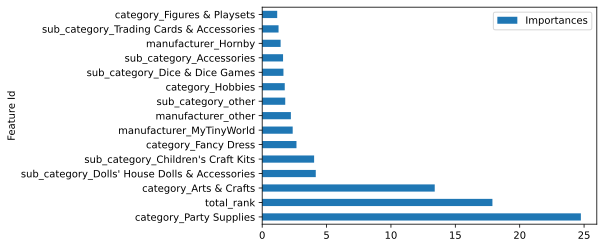

In [101]:
barh_plot(f_importance[:15])

In [102]:
df_numcat = df.drop(text_cols, axis=1).copy()

In [103]:
df_numcat = pd.get_dummies(df_numcat, columns=cat_cols, dummy_na=False)

In [104]:
y = df_numcat['price']
X = df_numcat.drop(['price', 'most_recent_price'], axis=1)

In [105]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=SEED)

In [106]:
catboost_numcat = CatBoostRegressor(iterations = 5000,
                          #depth=10,
                          #learning_rate = 0.5,
                          random_seed = SEED,
                          eval_metric='RMSE',
                          od_wait=500,
                          train_dir='/content'
                         )
catboost_numcat.fit(X_train, np.log(y_train),
         eval_set=(X_test, np.log(y_test)),
         verbose_eval=100,
         use_best_model=True,
         #plot=True,
         )

Learning rate set to 0.025796
0:	learn: 1.0940377	test: 1.1276800	best: 1.1276800 (0)	total: 5.52ms	remaining: 27.6s
100:	learn: 0.7019737	test: 0.7301592	best: 0.7301592 (100)	total: 1.14s	remaining: 55.4s
200:	learn: 0.6548967	test: 0.6889710	best: 0.6889710 (200)	total: 2.24s	remaining: 53.4s
300:	learn: 0.6337958	test: 0.6741781	best: 0.6741752 (299)	total: 3.37s	remaining: 52.7s
400:	learn: 0.6166881	test: 0.6649352	best: 0.6649352 (400)	total: 4.66s	remaining: 53.5s
500:	learn: 0.6012683	test: 0.6587775	best: 0.6587775 (500)	total: 5.71s	remaining: 51.3s
600:	learn: 0.5879408	test: 0.6537904	best: 0.6537904 (600)	total: 6.54s	remaining: 47.9s
700:	learn: 0.5760512	test: 0.6507214	best: 0.6507214 (700)	total: 7.56s	remaining: 46.4s
800:	learn: 0.5658593	test: 0.6479815	best: 0.6479797 (799)	total: 8.81s	remaining: 46.2s
900:	learn: 0.5565388	test: 0.6460910	best: 0.6460910 (900)	total: 9.92s	remaining: 45.1s
1000:	learn: 0.5477844	test: 0.6447297	best: 0.6447194 (999)	total: 10.9s

In [107]:
test_predict_catboost = np.exp(catboost_numcat.predict(X_test))
print(f"TEST RMSE: {(rmse(test_predict_catboost, y_test)):0.2f}%") # 27.93%

TEST RMSE: 29.39%


In [108]:
f_importance_numcat = catboost_numcat.get_feature_importance(prettified=True)

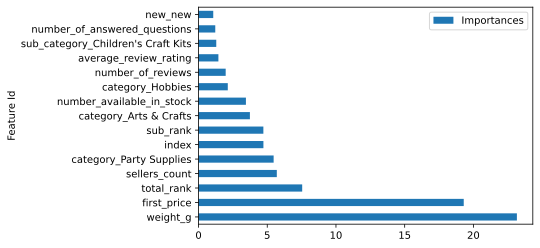

In [109]:
barh_plot(f_importance_numcat[:15])

## EDA

At first, I need to clean some columns, which have 0 or -1 values instead of NaN

In [110]:
for col in num_cols:
  print(f'{col}: ', df[col].min())

price:  0.01
number_available_in_stock:  -1
number_of_reviews:  0
number_of_answered_questions:  0
average_review_rating:  2.3
weight_g:  5.0
total_rank:  14
sub_rank:  1
sellers_count:  0
most_recent_price:  -1.0
first_price:  -1.0


Columns to clean/modify:  
**number_available_in_stock**  
**most_recent_price**  
**first_price**

### number_available_in_stock

Usually, if sellers count is 1, number_available_in_stock is missing.  
Replaced those values with 1, and other values with 0 (not available in stock)

In [111]:
df[df.number_available_in_stock == -1].number_available_in_stock

1      -1
3      -1
4      -1
5      -1
6      -1
       ..
8521   -1
8522   -1
8530   -1
8535   -1
8537   -1
Name: number_available_in_stock, Length: 2210, dtype: int64

Rank of Matrix: 12
Determinant of matrix: 0.3326
Shape of matrix: (12, 12)


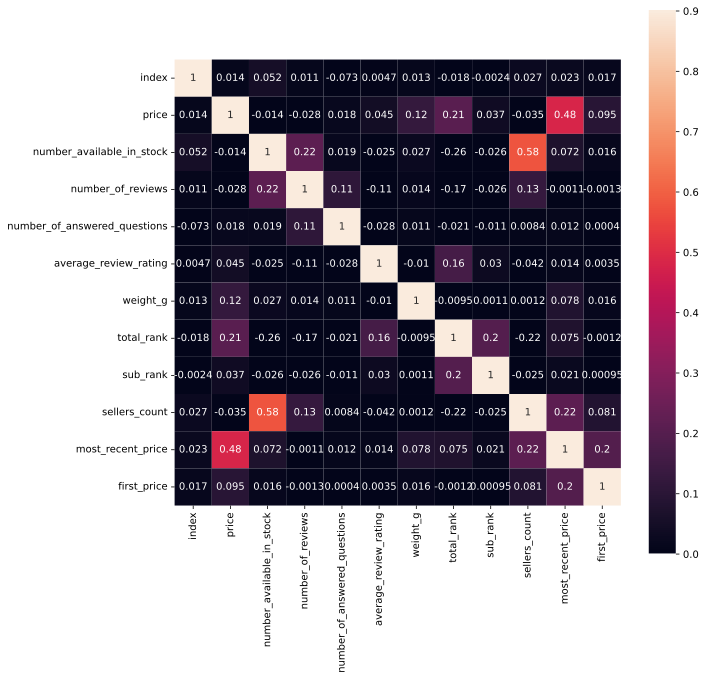

In [112]:
corr_matrix(df)

In [113]:
sellers_per_stock = df[['number_available_in_stock', 'sellers_count']].groupby('sellers_count').mean()
sellers_per_stock

,number_available_in_stock
sellers_count,
0,5.427764
1,-0.872542
2,1.965296
3,3.015601
4,4.042424
5,5.027100
6,6.025237
7,6.992063
8,7.970732


In [114]:
df.loc[((df.number_available_in_stock == -1) & (df.sellers_count == 1)), 'number_available_in_stock'] = 1

In [115]:
df.loc[df.number_available_in_stock == -1, 'number_available_in_stock'] = 0

### most_recent_price

High correlation with target feature. A lot of -1 (missing values).  
Also, this column very often actually repeats price column. Might have to remove it.


In [116]:
df.most_recent_price.value_counts()

-1.00      3953
 14.99       70
 9.99        69
 12.99       62
 7.99        48
           ... 
 4.72         1
 20.02        1
 13.40        1
 38.87        1
 116.50       1
Name: most_recent_price, Length: 2146, dtype: int64

In [117]:
df_mprice = df.copy() # just to keep a copy if needed

In [118]:
df['price_difference'] = df[df.most_recent_price != -1].most_recent_price - df.price

In [119]:
df['price_difference'].value_counts(dropna=False)

NaN      3953
0.00     1340
0.01       90
0.02       37
1.00       36
         ... 
1.17        1
2.52        1
99.89       1
2.59        1
72.51       1
Name: price_difference, Length: 1973, dtype: int64

In [120]:
df.drop(['most_recent_price', 'price_difference'], axis=1, inplace=True)

### first_price

Abot 40% of missing values.  
Decided to fill missing values based on price difference (+45.5% price for the first price)

In [121]:
df_fprice = df.copy()

In [122]:
df['price_difference_percent'] = (df.price - df[df.first_price != -1].first_price) / df.price

In [123]:
abs_price_diff_percent = abs(round(df.price_difference_percent.median(), 3))
abs_price_diff_percent

0.455

In [124]:
def fill_first_price(df):
  if df.first_price == -1:
    df.first_price = df.price + (df.price*0.455)
  return df

In [125]:
df = df.apply(fill_first_price, axis=1)

In [126]:
df.drop(['price_difference_percent'], axis=1, inplace=True)

### Columns analysis 

In [127]:
num_cols.remove('most_recent_price')

In [128]:
for col in cat_cols+num_cols:
  print(f'{col}: \n{df[col].describe()}\n')

manufacturer: 
count      8541
unique       31
top       other
freq       6478
Name: manufacturer, dtype: object

category: 
count        8541
unique         15
top       Hobbies
freq         1744
Name: category, dtype: object

sub_category: 
count      8541
unique       31
top       other
freq       1149
Name: sub_category, dtype: object

new: 
count     8541
unique       5
top        new
freq      6265
Name: new, dtype: object

price: 
count    8541.000000
mean       19.970130
std        38.219449
min         0.010000
25%         4.990000
50%        10.560000
75%        19.990000
max       995.110000
Name: price, dtype: float64

number_available_in_stock: 
count    8541.000000
mean        6.644538
std         8.618976
min         0.000000
25%         1.000000
50%         4.000000
75%         8.000000
max        92.000000
Name: number_available_in_stock, dtype: float64

number_of_reviews: 
count    8541.000000
mean        9.545018
std        35.908301
min         0.000000
25%         

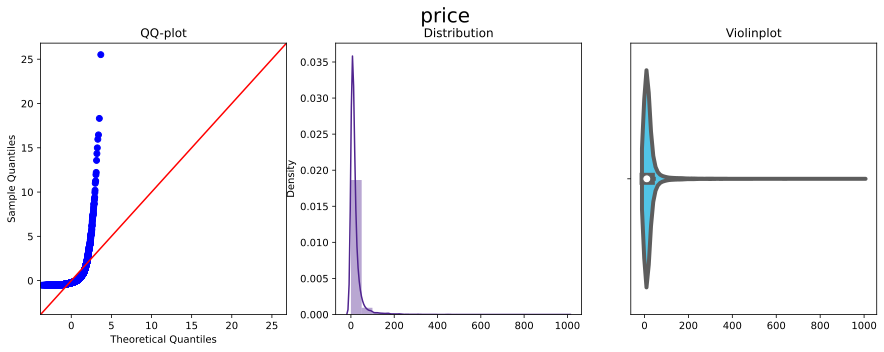

Bot: -17.51, Top: 42.49, Outliers: 778


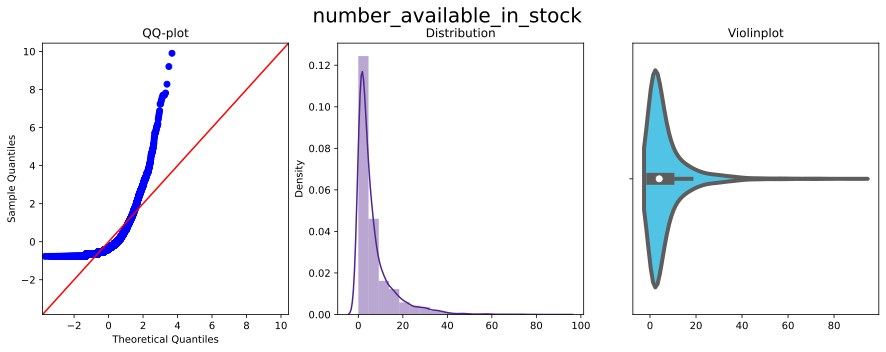

Bot: -9.5, Top: 18.5, Outliers: 724


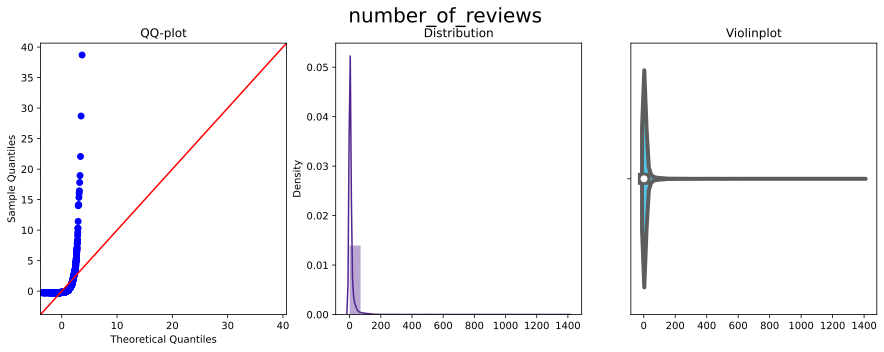

Bot: -6.5, Top: 13.5, Outliers: 1181


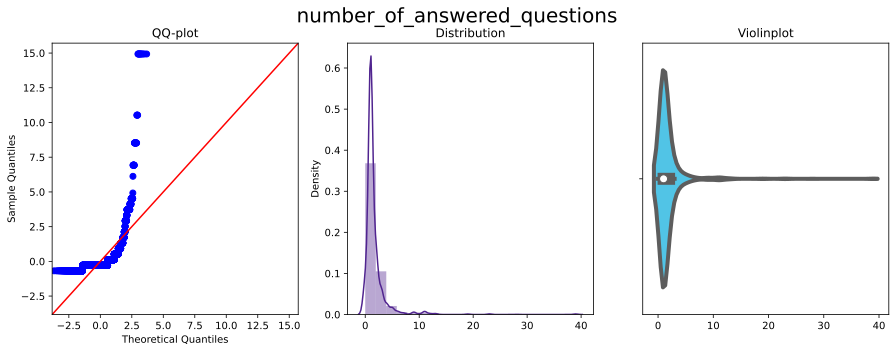

Bot: -0.5, Top: 3.5, Outliers: 659


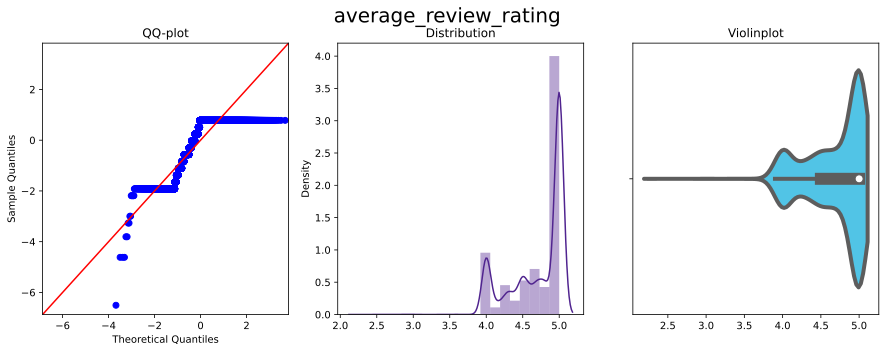

Bot: 3.75, Top: 5.75, Outliers: 10


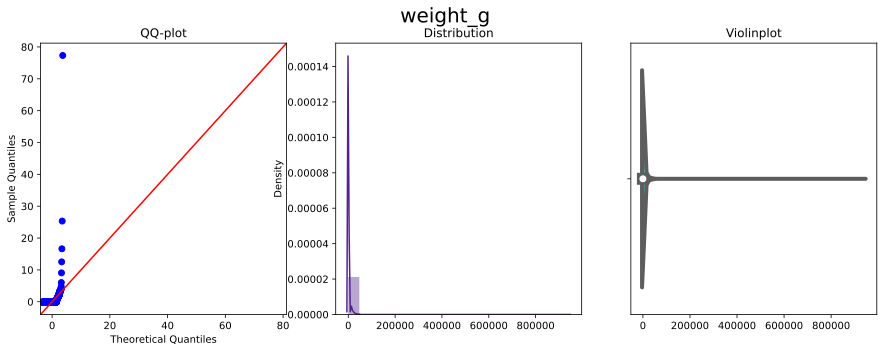

Bot: -424.0, Top: 864.0, Outliers: 827


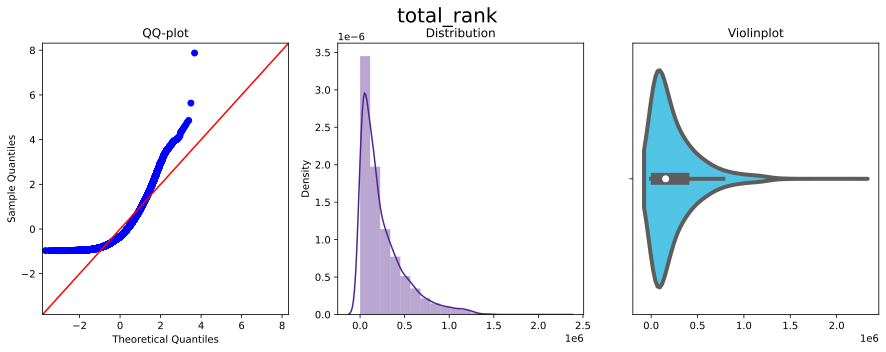

Bot: -369343.5, Top: 778380.5, Outliers: 444


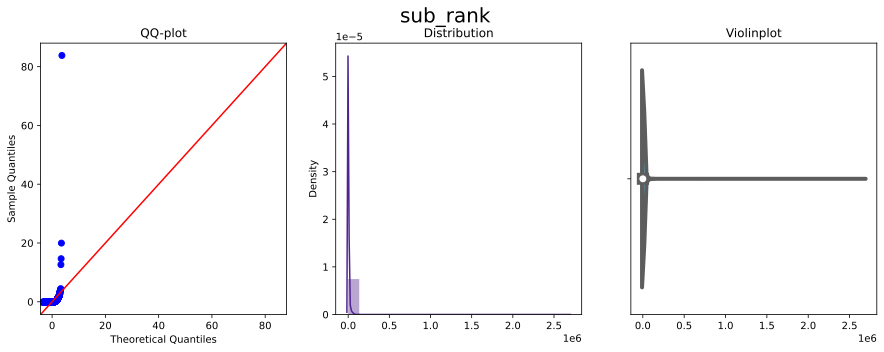

Bot: -3537.5, Top: 6754.5, Outliers: 1219


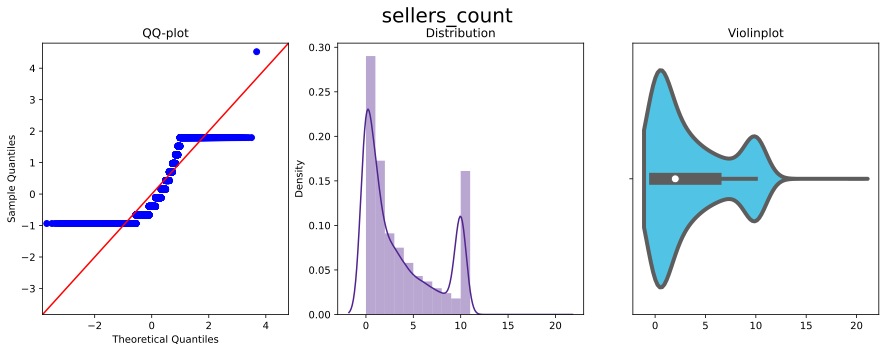

Bot: -9.0, Top: 15.0, Outliers: 1


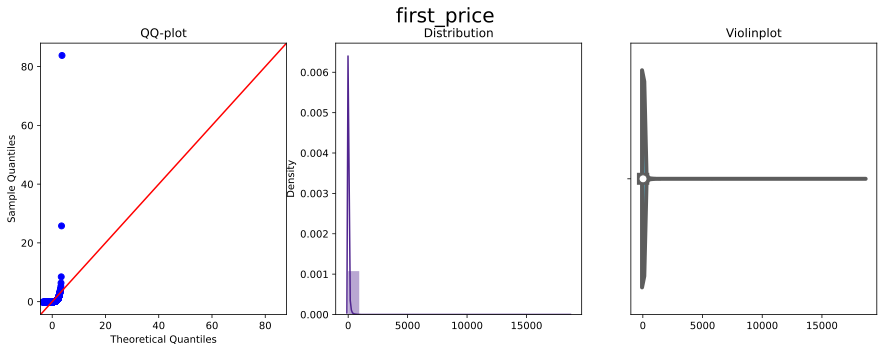

Bot: -38.219, Top: 83.059, Outliers: 762


In [129]:
for col in num_cols:
  num_vis(df[col], title=col)
  find_outliers(df[col])

Rank of Matrix: 11
Determinant of matrix: 0.469
Shape of matrix: (11, 11)


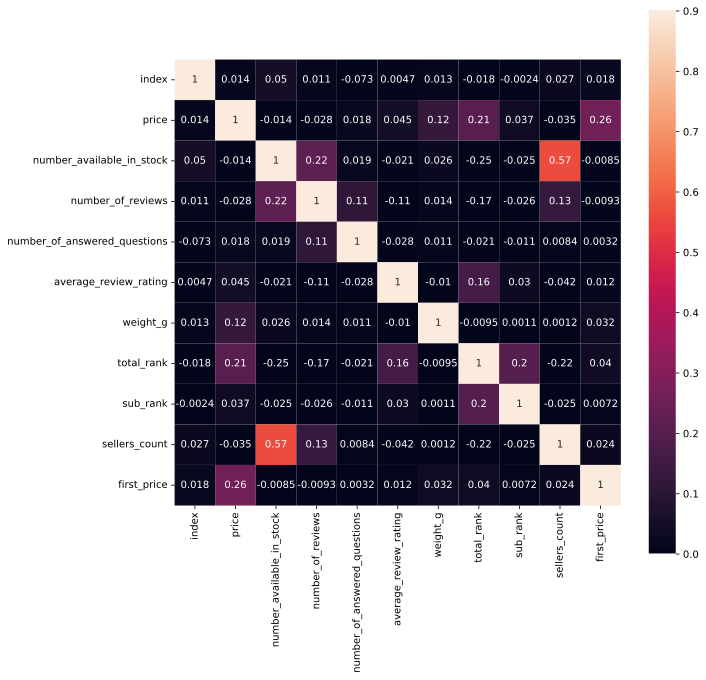

In [130]:
corr_matrix(df)

- Pretty much evey numerical column should be normalized, outliers are present as well.   
- Only 2 columns are highly correlated - sellers_count & number_available_in_stock. This is due to filling missing values in number in stock based on sellers_count values
- 

## Text Analysis

0       Product Description Hornby 2014 Catalogue Box ...
1       Size Name:Large FunkyBuys® Large Christmas Hol...
2       BIG CLASSIC TOY TRAIN SET TRACK CARRIAGE LIGHT...
3       Hornby 00 Gauge BR Hawksworth 3rd Class W 2107...
4       Product Description Hornby RailRoad 0-4-0 Gild...
                              ...                        
8534    IRON MAN needs a drill thats as tough as he is...
8535    6 inch action figure featuring the Kato chract...
8536    DC 66 Batman Classic TV Series 6 Inch Riddler ...
8538    *Includes 1x Badge with holder and chain *High...
8539    Designed by Ed BenesIt's here - the third seri...
Name: description, Length: 7995, dtype: object